In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [2]:
df = pd.read_csv('Car_details_v3.csv')

In [3]:
df.sample(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
4109,Maruti Wagon R AMT VXI Option,2018,509999,8000,Petrol,Individual,Automatic,Second Owner,20.51 kmpl,998 CC,67 bhp,90Nm@ 3500rpm,5.0
7257,Mahindra Bolero Power Plus ZLX,2017,660000,60000,Diesel,Individual,Manual,Second Owner,16.5 kmpl,1493 CC,70 bhp,195Nm@ 1400-2200rpm,7.0
5347,Hyundai Verna Transform VGT CRDi,2010,195000,120000,Diesel,Individual,Manual,Second Owner,16.2 kmpl,1493 CC,110 bhp,24 KGM at 1900-2750 RPM,5.0
1118,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
7836,Chevrolet Enjoy TCDi LT 7 Seater,2013,380000,70000,Diesel,Individual,Manual,Second Owner,18.2 kmpl,1248 CC,73.8 bhp,172.5Nm@ 1750rpm,7.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [5]:
df['Brand'] = df.iloc[:, 0].apply(lambda x: str(x).split()[0] if pd.notna(x) else "")

In [6]:
# df['Name'] = df['name'].apply(lambda x: "".join(x.split()[1:]) if pd.notna(x) else "")
df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))

In [7]:
df['model']

0              Swift Dzire VDI
1       Rapid 1.5 TDI Ambition
2           City 2017-2020 EXi
3            i20 Sportz Diesel
4              Swift VXI BSIII
                 ...          
8123                 i20 Magna
8124             Verna CRDi SX
8125           Swift Dzire ZDi
8126                Indigo CR4
8127                Indigo CR4
Name: model, Length: 8128, dtype: object

In [8]:
df.drop(columns='name',axis=1,inplace=True)

In [9]:
df.isnull().sum()

year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
Brand              0
model              0
dtype: int64

In [10]:
df.shape

(8128, 14)

In [11]:
df_new = df.copy()

In [12]:
df_new =df_new.dropna()

In [13]:
df_new.isnull().sum()

year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
Brand            0
model            0
dtype: int64

In [14]:
df_new.shape

(7906, 14)

In [15]:
df_new

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4


In [16]:
str(df_new.iloc[0,8]).split()[0]

'1248'

In [17]:
df_new['Engine_data'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")
df_new['Engine_CC'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [18]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [19]:
df_new.drop(columns='engine',inplace=True)

In [20]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [21]:
df_new['Mileage_data'] = df_new['mileage'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0").astype(float)
df_new['Mileage_unit'] = df_new['mileage'].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [22]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl


In [23]:
df_new.drop(columns='mileage',inplace=True)

In [24]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,82.85 bhp,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna,1197,CC,18.50,kmpl
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX,1493,CC,16.80,kmpl
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,73.9 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi,1248,CC,19.30,kmpl
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,70 bhp,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4,1396,CC,23.57,kmpl


In [25]:
df_new['Max_power'] = df_new['max_power'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")

In [26]:
df_new.drop(columns='max_power',inplace=True)

In [27]:
df_new['Mileage_data'] = df_new['Mileage_data'].astype(float)
df_new[ 'Max_power'] = df_new['Max_power'].astype(float)
df_new['Engine_data'] = df_new['Engine_data'].astype(float)

In [28]:
df_new.drop(columns='Engine_CC',inplace=True)

In [29]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna,1197.0,18.50,kmpl,82.85
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX,1493.0,16.80,kmpl,110.00
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi,1248.0,19.30,kmpl,73.90
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4,1396.0,23.57,kmpl,70.00


In [30]:
categorical_cols = df_new.select_dtypes(include=['object', 'category']).columns  # Select categorical columns

for col in categorical_cols:
    print(f"Value counts for column: {col}\n")
    print(df_new[col].value_counts(), "\n" + "-"*40 + "\n")  # Display counts for each unique value


Value counts for column: fuel

fuel
Diesel    4299
Petrol    3520
CNG         52
LPG         35
Name: count, dtype: int64 
----------------------------------------

Value counts for column: seller_type

seller_type
Individual          6563
Dealer              1107
Trustmark Dealer     236
Name: count, dtype: int64 
----------------------------------------

Value counts for column: transmission

transmission
Manual       6865
Automatic    1041
Name: count, dtype: int64 
----------------------------------------

Value counts for column: owner

owner
First Owner             5215
Second Owner            2016
Third Owner              510
Fourth & Above Owner     160
Test Drive Car             5
Name: count, dtype: int64 
----------------------------------------

Value counts for column: torque

torque
190Nm@ 2000rpm             530
200Nm@ 1750rpm             445
90Nm@ 3500rpm              405
113Nm@ 4200rpm             223
114Nm@ 4000rpm             171
                          ... 
128Nm@

In [31]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
df_new['torque'].value_counts()

torque
190Nm@ 2000rpm                 530
200Nm@ 1750rpm                 445
90Nm@ 3500rpm                  405
113Nm@ 4200rpm                 223
114Nm@ 4000rpm                 171
62Nm@ 3000rpm                  164
69Nm@ 3500rpm                  141
160Nm@ 2000rpm                 138
330Nm@ 1600-2800rpm            122
74.5Nm@ 4000rpm                121
59Nm@ 2500rpm                  112
110Nm@ 4800rpm                 112
219.7Nm@ 1500-2750rpm          101
195Nm@ 1400-2200rpm            101
114.7Nm@ 4000rpm                97
400Nm@ 1750-2500rpm             96
20.4@ 1400-3400(kgm@ rpm)       82
72Nm@ 4386rpm                   78
290Nm@ 1800-2800rpm             76
259.9Nm@ 1900-2750rpm           75
114Nm@ 3500rpm                  75
140Nm@ 1800-3000rpm             73
250Nm@ 1500-2500rpm             73
113.75nm@ 4000rpm               72
115Nm@ 4000rpm                  72
205Nm@ 1750-3250rpm             68
320Nm@ 1700-2700rpm             66
259.8Nm@ 1900-2750rpm           65
430Nm@ 1750-2

In [32]:
df_new['Torque_NM'] = df_new['torque'].apply(lambda x: str(x).split()[0].replace('Nm', "").replace('NM', "").replace('nm', "").replace('@', "").replace('kgm', '') if pd.notna(x) and str(x).strip() else np.nan)
df_new['Torque_NM'] = df_new['Torque_NM'].str.extract(r'([\d.]+)')

In [33]:
# Regex pattern to match valid torque values and their respective rpm
valid_pattern = r"(\d+\.?\d*)\s*(nm|Nm)\s*@\s*\(?(\d+(-\d+)?)\)?\s*rpm"

# Function to handle and format the torque values
def handle_and_format_torque(value):
    # First, normalize the value by fixing common errors
    value = value.lower().replace('kgm', 'nm')  # Correct "kgm" to "nm"
    value = re.sub(r'\s+', ' ', value)  # Remove extra spaces
    value = value.replace(',', '')  # Remove commas
    value = re.sub(r'(\d)\s*-\s*(\d)', r'\1-\2', value)  # Ensure no spaces in rpm ranges
    value = re.sub(r'(\d)\s*(@)\s*(\d)', r'\1@ \3', value)  # Fix spacing around "@"

    # Check if the format is valid after normalization
    match = re.match(valid_pattern, value)
    if match:
        torque = match.group(1)
        rpm = match.group(3)

        # Return in the desired format
        if '-' in rpm:
            return f"{torque}Nm @ ({rpm})rpm"
        else:
            return f"{torque}Nm @ {rpm}rpm"
    
    # If still invalid, return the original value with an error message
    return f"Invalid format: {value}"

In [34]:
# Convert the torque values in the DataFrame column to the desired format
# df_new['Formated_tor'] = df_new['torque_values'].apply(format_torque_value)

In [35]:
# df_new['torque'].apply(handle_and_format_torque)

In [36]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.7
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.4
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.5


In [37]:
# df_new['Torque_RPM'] = df_new['torque'].apply(lambda x: str(x).split()[1].replace('rpm', "").replace('(', "").replace('@', "").replace('kgm', '').replace('+', '').replace('/', '').replace(',', '').replace('NM', '') if pd.notna(x) and len(str(x).split()) > 1 and str(x).strip() else np.nan)

In [38]:
# df_new['Torque_RPM'].value_counts()

In [39]:
# df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))
df_new[['torque_Nm', 'rpm']] = df_new['torque'].str.split(" ", n=1, expand=True)
# df1['torque_Nm'] = df1['torque_Nm'].str.extract(r'([\d.]+)')
df_new[['Min_rpm', 'Max_rpm']] = df_new['rpm'].str.extract(r'(\d+)-?(\d+)?')
df_new['Max_rpm'] = df_new['Max_rpm'].fillna(df_new['Min_rpm'])
df_new[["Min_rpm", "Max_rpm"]] = df_new[["Min_rpm", "Max_rpm"]].astype("float64")
df_new["RPM"] = (df_new['Min_rpm'] + df_new['Max_rpm'])/2

In [40]:
df_new['Torque_NM'] = df_new['Torque_NM'].astype("float64")

In [41]:
df_new.drop(columns=['torque_Nm', 'rpm', 'Min_rpm', 'Max_rpm'], inplace=True)

In [42]:
df_new.drop(columns=['torque'], inplace=True)

In [43]:
df_new.head(10)

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM,RPM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190.00,2000.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250.00,2000.0
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.70,2.0
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.40,2250.0
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.50,4.0
5,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,Hyundai,Xcent 1.2 VTVT E Plus,1197.0,20.14,kmpl,81.86,113.75,4000.0
6,2007,96000,175000,LPG,Individual,Manual,First Owner,5.0,Maruti,Wagon R LXI DUO BSIII,1061.0,17.30,km/kg,57.50,7.80,4.0
7,2001,45000,5000,Petrol,Individual,Manual,Second Owner,4.0,Maruti,800 DX BSII,796.0,16.10,kmpl,37.00,59.00,2500.0
8,2011,350000,90000,Diesel,Individual,Manual,First Owner,5.0,Toyota,Etios VXD,1364.0,23.59,kmpl,67.10,170.00,2100.0
9,2013,200000,169000,Diesel,Individual,Manual,First Owner,5.0,Ford,Figo Diesel Celebration Edition,1399.0,20.00,kmpl,68.10,160.00,2000.0


In [44]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7906 entries, 0 to 8127
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   year           7906 non-null   int64  
 1   selling_price  7906 non-null   int64  
 2   km_driven      7906 non-null   int64  
 3   fuel           7906 non-null   object 
 4   seller_type    7906 non-null   object 
 5   transmission   7906 non-null   object 
 6   owner          7906 non-null   object 
 7   seats          7906 non-null   float64
 8   Brand          7906 non-null   object 
 9   model          7906 non-null   object 
 10  Engine_data    7906 non-null   float64
 11  Mileage_data   7906 non-null   float64
 12  Mileage_unit   7906 non-null   object 
 13  Max_power      7906 non-null   float64
 14  Torque_NM      7906 non-null   float64
 15  RPM            7872 non-null   float64
dtypes: float64(6), int64(3), object(7)
memory usage: 1.0+ MB


In [45]:
df_new.shape

(7906, 16)

In [46]:
X = df_new.drop(columns='selling_price')
y = df_new['selling_price']

In [47]:
X.shape , y.shape

((7906, 15), (7906,))

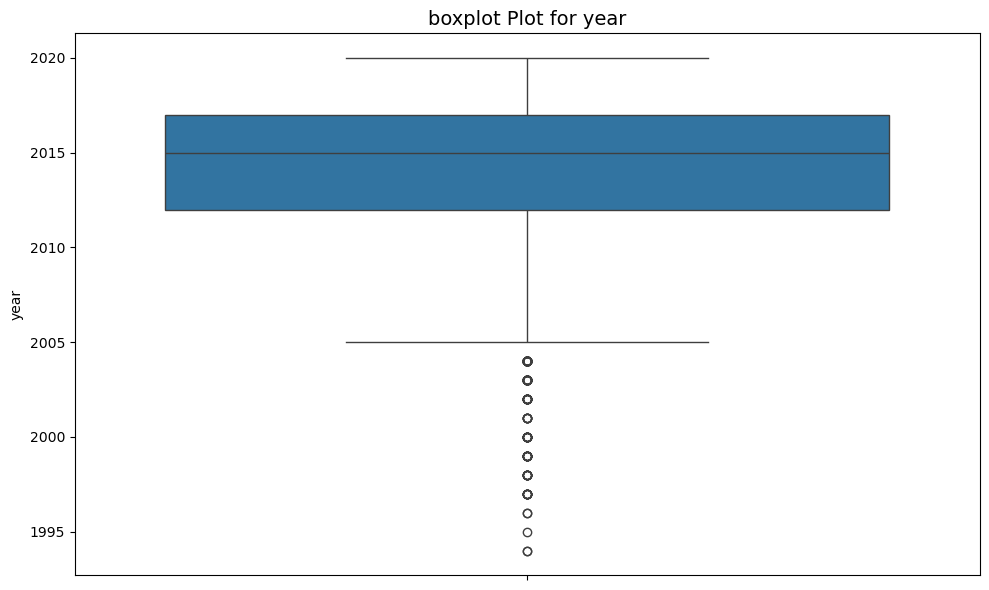

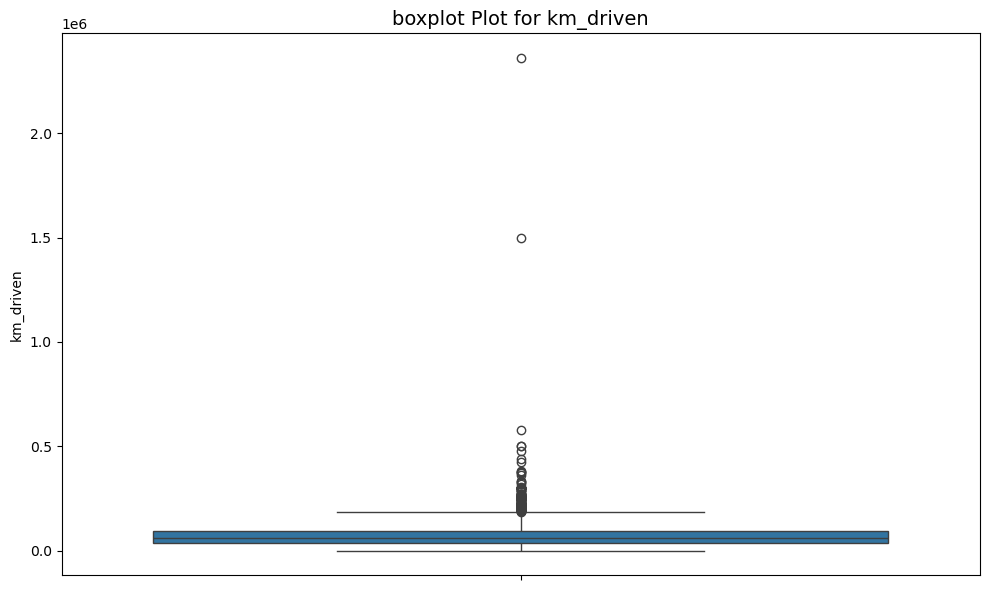

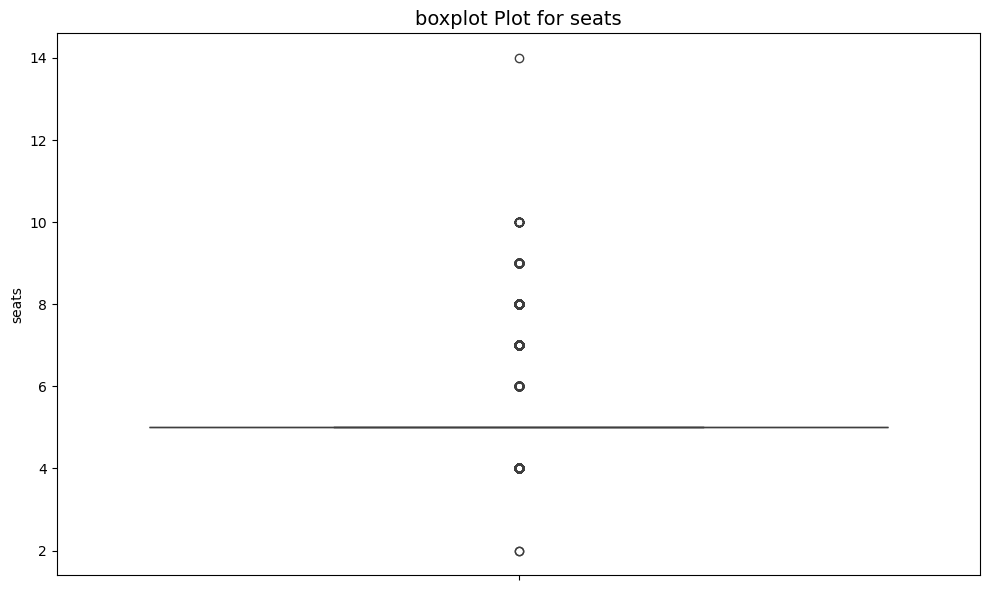

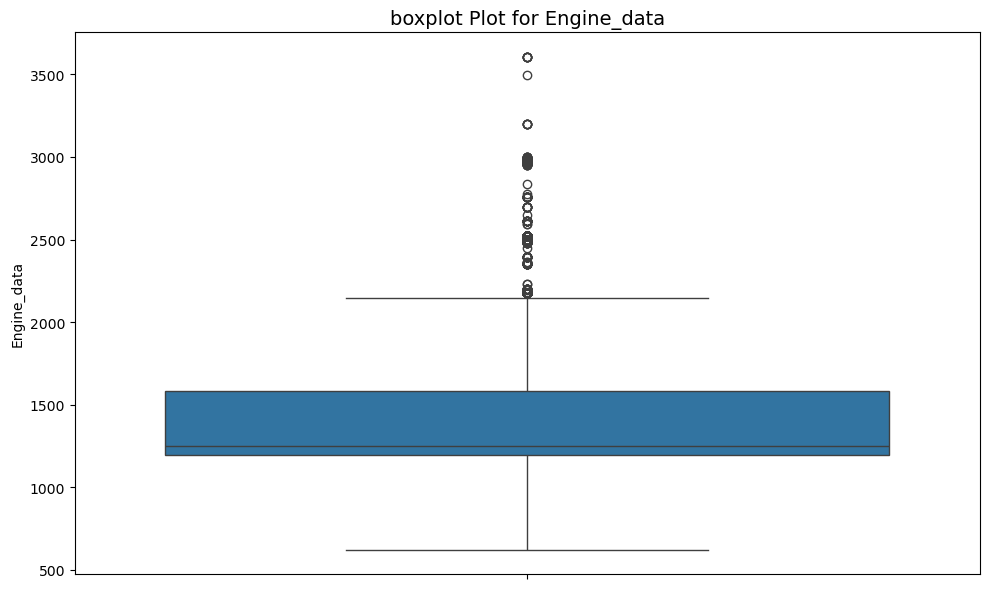

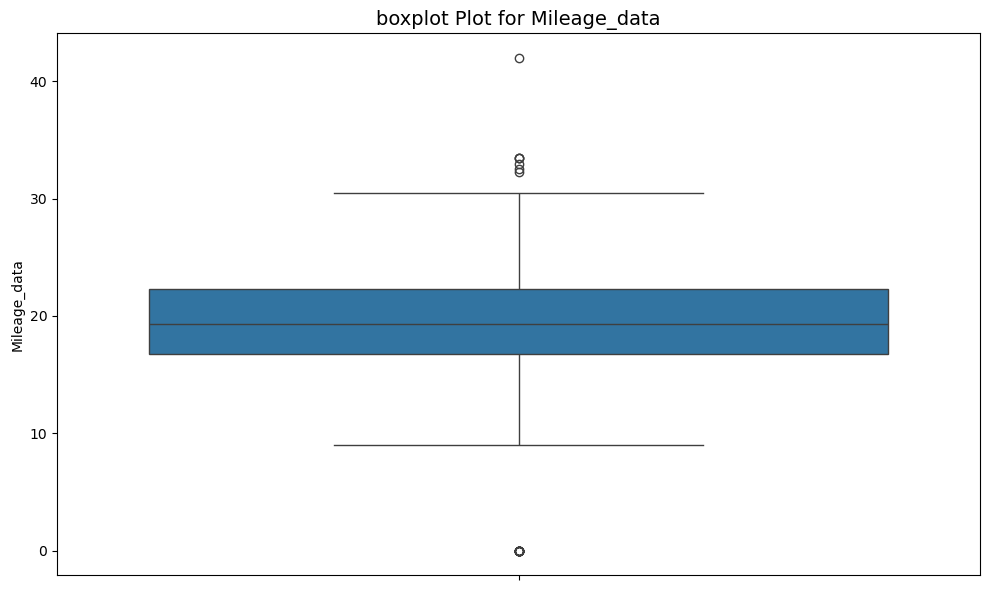

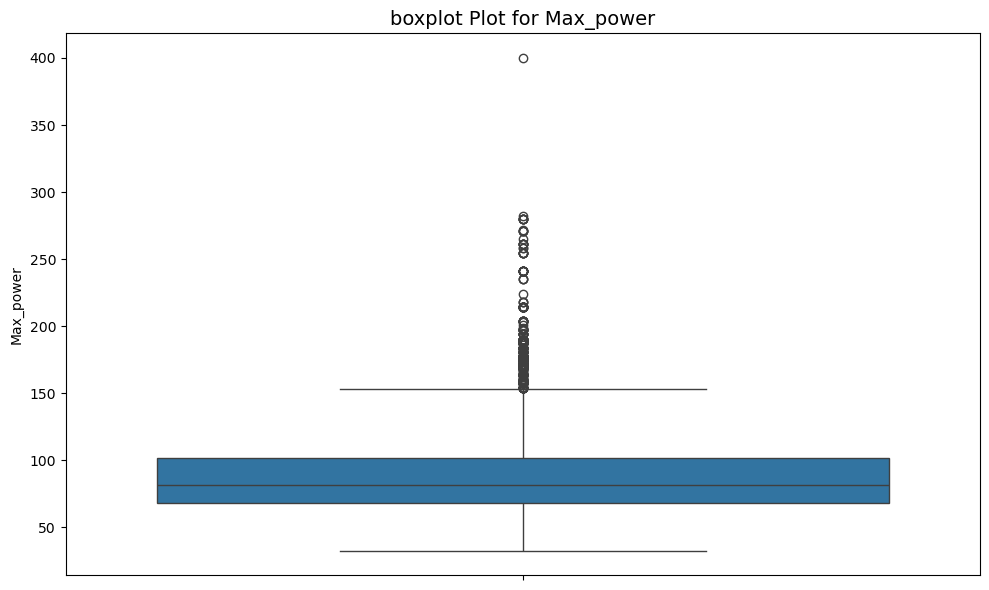

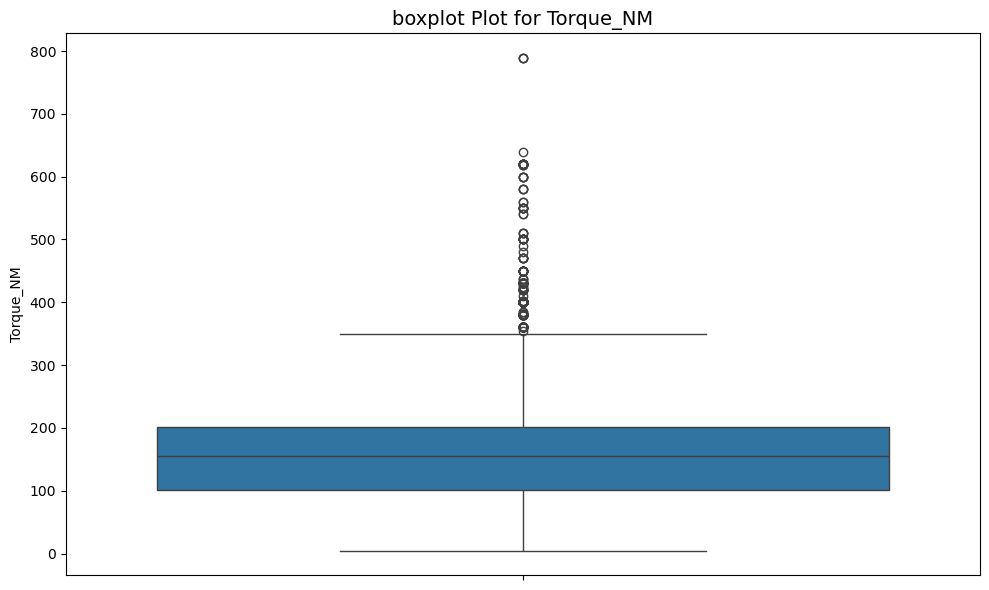

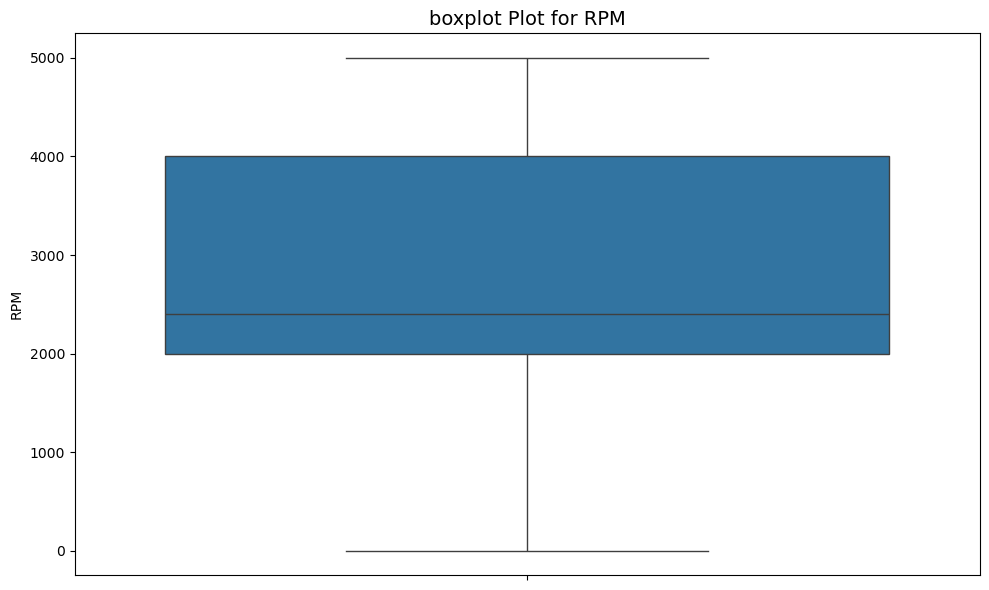

In [48]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [49]:
# Function to cap outliers using IQR
def cap_outliers_iqr(df):
    df_capped = df.copy()  # Make a copy to avoid modifying the original DataFrame

    # Loop through numeric columns and cap outliers based on IQR
    for column in df_capped.select_dtypes(include=[np.number]).columns:
        Q1 = df_capped[column].quantile(0.25)
        Q3 = df_capped[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values outside the bounds to the lower or upper bound
        df_capped[column] = np.clip(df_capped[column], lower_bound, upper_bound)

    return df_capped

In [50]:
X = cap_outliers_iqr(X)

In [51]:
X.shape

(7906, 15)

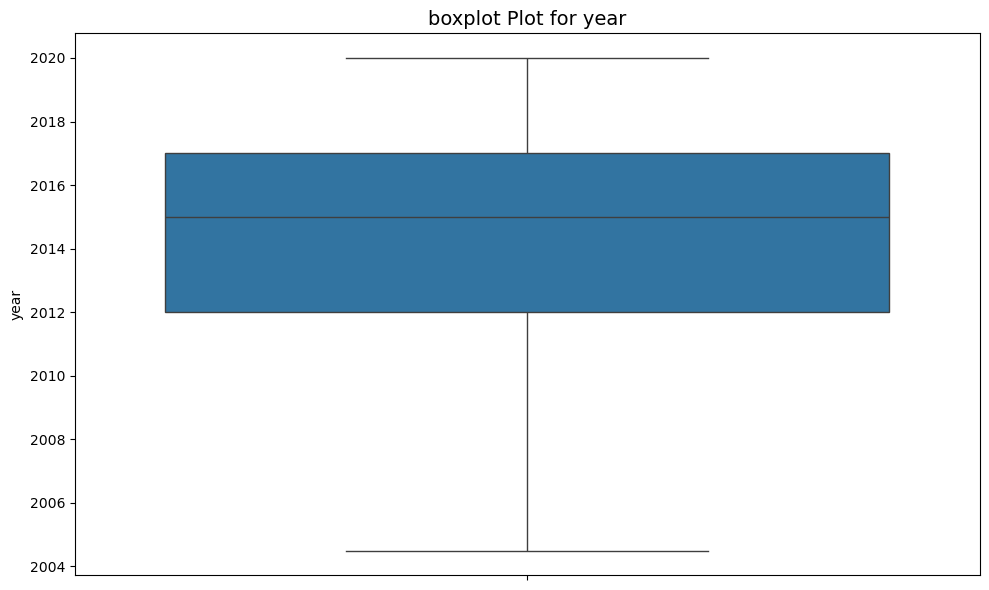

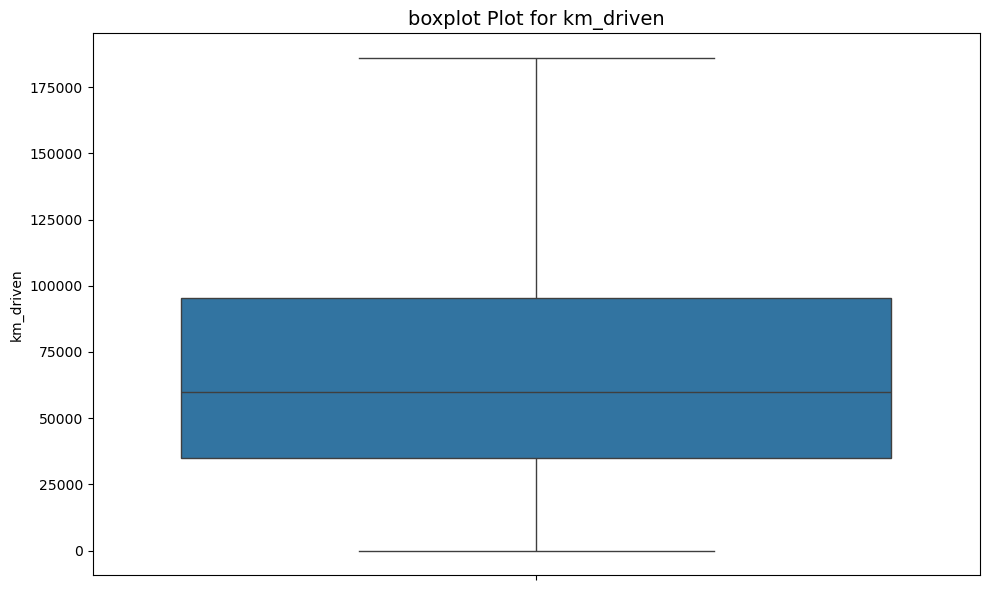

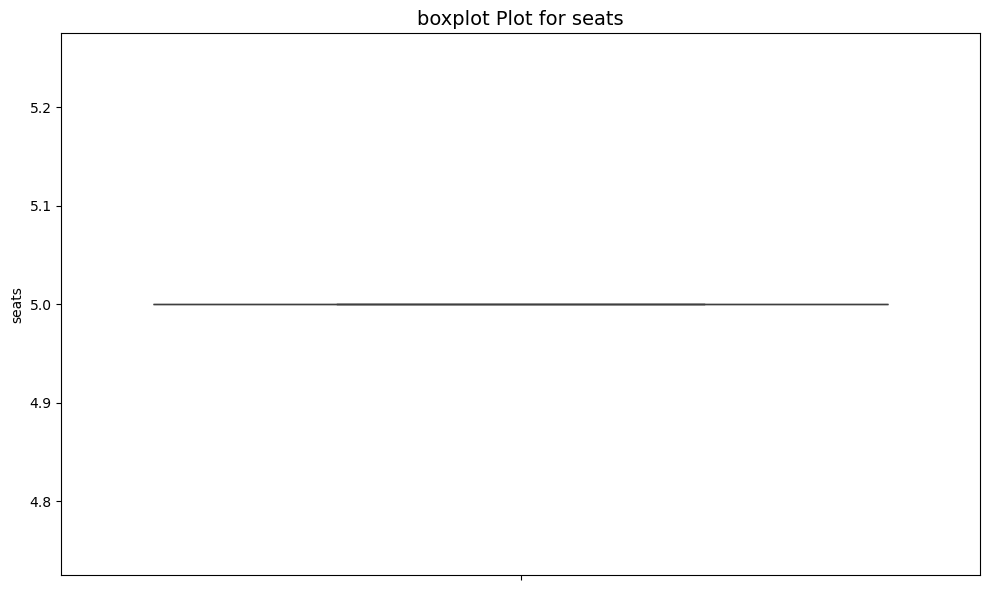

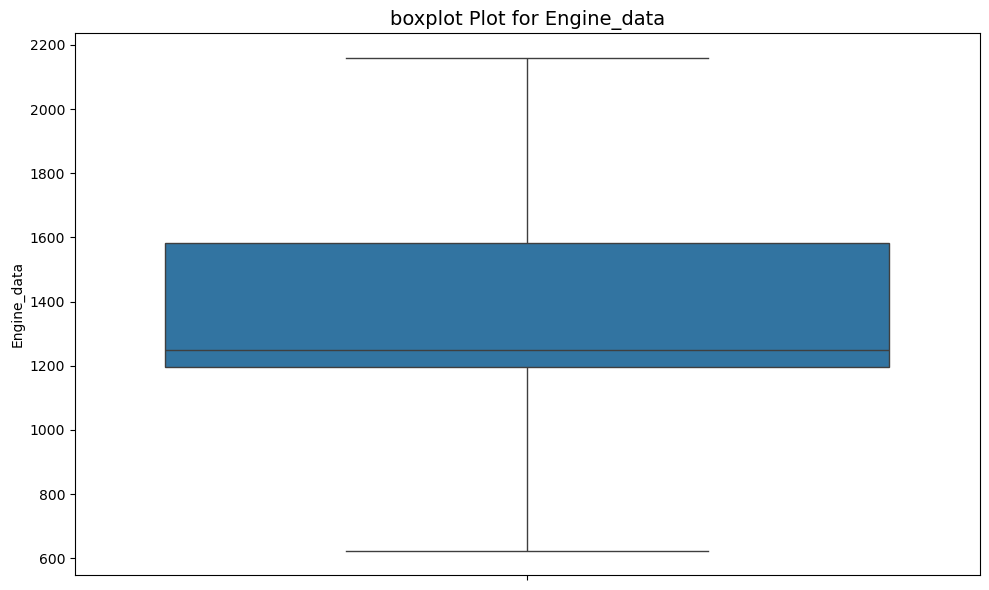

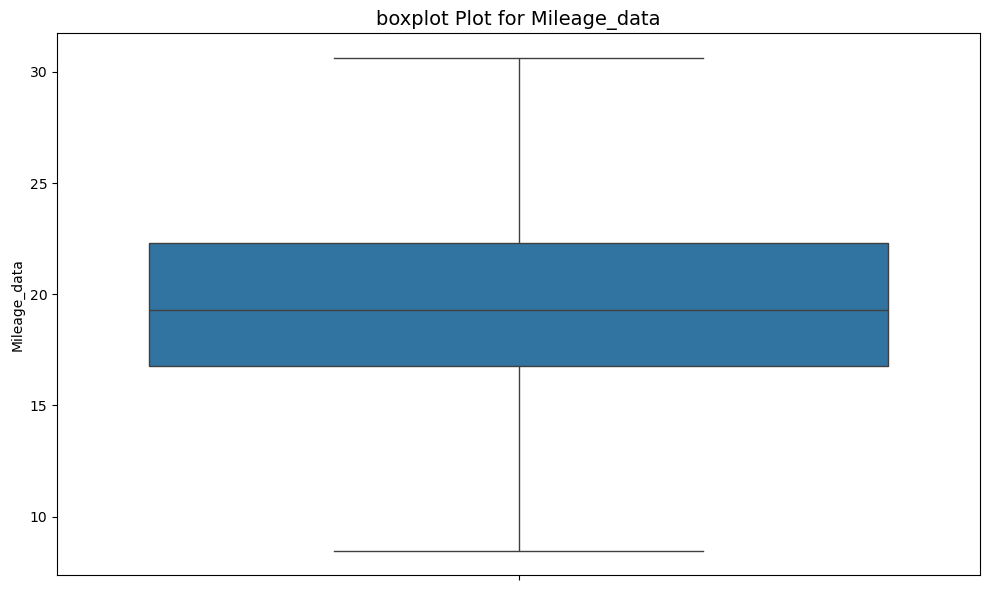

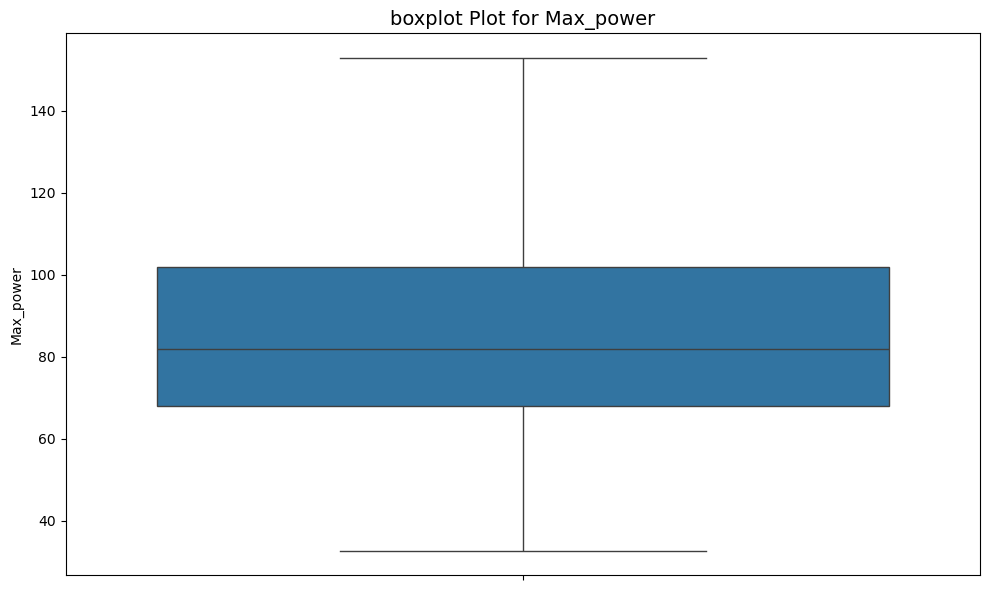

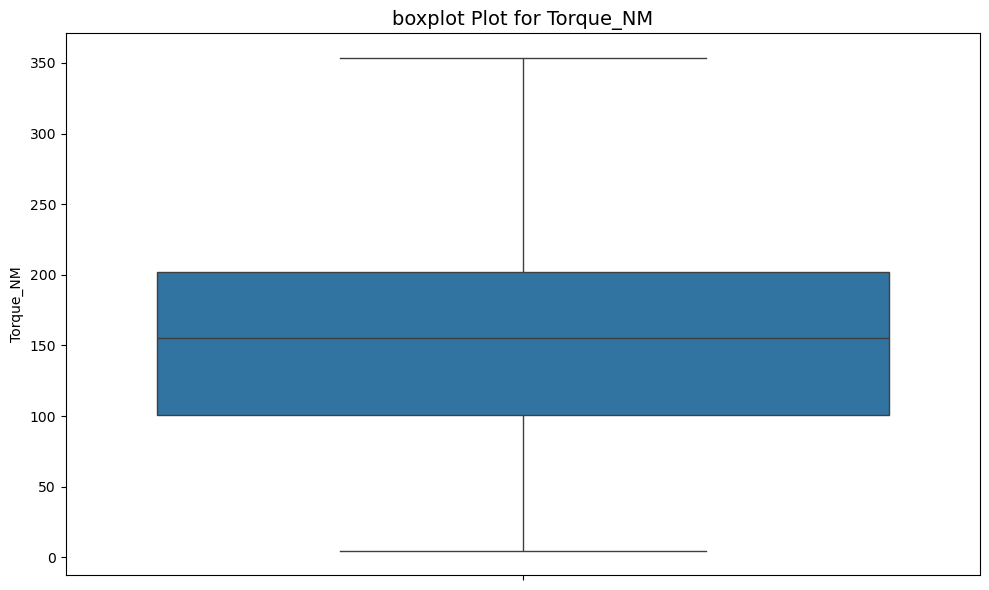

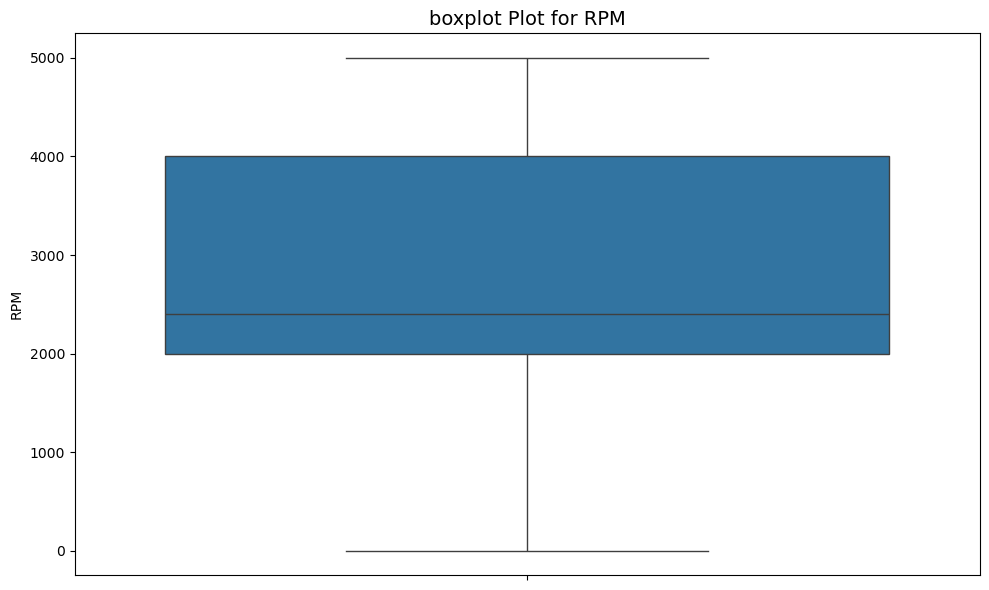

In [52]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [53]:
# num_X = X.select_dtypes(include=['number'])
# cat_X = X.select_dtypes(exclude=['number'])

In [54]:
# cat_X.head(10)

In [55]:
# cat_encoded = pd.get_dummies(cat_X, drop_first=True,dtype=int)

In [56]:
# cat_encoded.head(10)

In [57]:
# cat_encoded.shape

In [58]:
categorical_columns = X.select_dtypes(include=['object', 'category']).columns
categorical_columns

Index(['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model',
       'Mileage_unit'],
      dtype='object')

In [59]:
# X_final = pd.concat([num_X,cat_encoded], axis=1)
X_final = pd.get_dummies(X,columns=['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model','Mileage_unit'],dtype=float,drop_first=True)

In [60]:
X_final.sample(100)

year  km_driven  seats  Engine_data  Mileage_data  Max_power  \
3624  2016.0    60000.0    5.0       1197.0         16.90     82.000   
3074  2016.0    50000.0    5.0       1248.0         23.00     88.700   
4696  2009.0    70000.0    5.0       1248.0         19.30     73.900   
2028  2009.0   110000.0    5.0       1197.0         20.36     78.900   
1563  2017.0    45000.0    5.0       1999.0         19.33    152.925   
7613  2017.0    36000.0    5.0       1248.0         27.39     74.000   
1083  2013.0    58343.0    5.0        998.0         21.79     67.050   
4181  2007.0   100000.0    5.0       1193.0         15.30     65.300   
2562  2016.0   110000.0    5.0       1198.0         18.15     82.000   
115   2020.0    13000.0    5.0        998.0         21.63     67.040   
6055  2015.0    80000.0    5.0       1248.0         25.20     74.000   
5123  2010.0   110000.0    5.0       1399.0         20.00     68.000   
5722  2007.0   110000.0    5.0       2159.5         10.50    120.000   
6867  2019.0    15000.0    5.0        998.0         23.95     67.050   
7989  2017.0    50000.0    5.0       1197.0         18.90     82.000   
2516  2017.0    75000.0    5.0       1248.0         26.59     74.000   
3936  2017.0    60000.0    5.0       1248.0         24.30     88.500   
7502  2015.0    60000.0    5.0        799.0         25.17     53.300   
455   2012.0   120000.0    5.0       1396.0         22.54     88.730   
5043  2015.0    15000.0    5.0       1248.0         20.77     88.760   
5795  2013.0    90000.0    5.0       1968.0         17.20    138.100   
7873  2019.0     8500.0    5.0       1995.0         16.78    152.925   
3328  2012.0    41000.0    5.0       1197.0         20.36     78.900   
4325  2016.0    68089.0    5.0       2159.5         19.16    152.925   
6739  2019.0    15000.0    5.0       1497.0         20.00    115.000   
511   2017.0    25000.0    5.0        799.0         22.70     53.640   
6634  2018.0    30000.0    5.0       1248.0         28.40     74.020   
6156  2010.0   100000.0    5.0        998.0         20.92     67.100   
5736  2010.0   186062.5    5.0       1493.0         16.20    110.000   
4811  2004.5    90000.0    5.0        998.0         18.90     67.100   
6103  2011.0    81500.0    5.0       2143.0         14.84    152.925   
2068  2014.0    56000.0    5.0       1396.0         21.90     88.760   
3249  2015.0    40000.0    5.0       1582.0         17.60    126.200   
1007  2015.0   114368.0    5.0       2159.5         12.99    100.600   
4290  2019.0     5200.0    5.0       1199.0         20.30     83.810   
1690  2017.0    35000.0    5.0       1497.0         21.50    108.500   
6978  2014.0   120000.0    5.0       1248.0         23.40     74.000   
5942  2011.0    42545.0    5.0       1998.0         19.62    152.925   
2514  2017.0    27500.0    5.0       1197.0         18.90     81.860   
1140  2013.0    58343.0    5.0        998.0         21.79     67.050   
3782  2017.0    20000.0    5.0       1298.0         11.96     80.000   
3131  2011.0   120000.0    5.0       2159.5         13.00     95.000   
7067  2012.0    80000.0    5.0        796.0         19.70     46.300   
7522  2017.0    50000.0    5.0       2159.5         11.36    152.925   
7916  2014.0   100000.0    5.0       1396.0         22.54     88.730   
3901  2012.0    72072.0    5.0       1248.0         21.10     73.900   
1867  2013.0    79328.0    5.0       2159.5         12.99    100.600   
3698  2013.0    50000.0    5.0       1498.0         25.80     98.600   
3439  2012.0   120000.0    5.0       1461.0         21.03     65.000   
1790  2011.0    80000.0    5.0       1599.0         16.20    103.200   
3465  2015.0    52269.0    5.0       2159.5         15.40    120.000   
1784  2013.0    90000.0    5.0       1399.0         20.00     68.100   
6442  2011.0    87000.0    5.0       1248.0         18.00     75.000   
4763  2019.0    15000.0    5.0       1956.0         17.00    152.925   
3958  2014.0    31000.0    5.0        998.0     

In [61]:
X_final['RPM'] = X_final['RPM'].ffill()

In [62]:
X_final.isnull().sum()

year                                                   0
km_driven                                              0
seats                                                  0
Engine_data                                            0
Mileage_data                                           0
Max_power                                              0
Torque_NM                                              0
RPM                                                    0
fuel_Diesel                                            0
fuel_LPG                                               0
fuel_Petrol                                            0
seller_type_Individual                                 0
seller_type_Trustmark Dealer                           0
transmission_Manual                                    0
owner_Fourth & Above Owner                             0
owner_Second Owner                                     0
owner_Test Drive Car                                   0
owner_Third Owner              

In [63]:
X_final.shape

(7906, 2030)

In [64]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_final,y,test_size=0.2,random_state=42)

In [65]:
X_train.dtypes

year                                                   float64
km_driven                                              float64
seats                                                  float64
Engine_data                                            float64
Mileage_data                                           float64
Max_power                                              float64
Torque_NM                                              float64
RPM                                                    float64
fuel_Diesel                                            float64
fuel_LPG                                               float64
fuel_Petrol                                            float64
seller_type_Individual                                 float64
seller_type_Trustmark Dealer                           float64
transmission_Manual                                    float64
owner_Fourth & Above Owner                             float64
owner_Second Owner                                     

In [66]:
X_train.shape , y_train.shape , X_test.shape , y_test.shape

((6324, 2030), (6324,), (1582, 2030), (1582,))

In [67]:
X_train.sample(40)

year  km_driven  seats  Engine_data  Mileage_data  Max_power  \
4289  2016.0    90000.0    5.0       1405.0         19.09     69.010   
6998  2009.0    55000.0    5.0       1368.0         14.60     88.700   
5858  2015.0    74000.0    5.0       1995.0         18.88    152.925   
5835  2015.0    80000.0    5.0       1120.0         24.00     70.000   
1294  2017.0    50000.0    5.0       1186.0         25.40     73.970   
4660  2013.0    70000.0    5.0       1405.0         19.40     70.000   
1405  2011.0    85000.0    5.0       1248.0         18.00     75.000   
4724  2018.0   140000.0    5.0       2159.5         14.10    147.940   
6480  2019.0    15000.0    5.0       1591.0         17.00    121.300   
4600  2011.0    85000.0    5.0       1248.0         21.10     73.900   
1309  2016.0    51500.0    5.0        799.0         25.17     53.300   
7898  2017.0   120000.0    5.0       1248.0         24.52     88.500   
3220  2015.0    80000.0    5.0       1396.0         22.54     88.730   
379   2013.0    79328.0    5.0       2159.5         12.99    100.600   
4352  2010.0   186062.5    5.0       1948.0         14.00     90.000   
8024  2012.0    35000.0    5.0        814.0         21.10     55.200   
6595  2019.0     5000.0    5.0       1086.0         20.30     68.000   
108   2010.0   114000.0    5.0       1798.0         14.30    152.925   
4659  2019.0     5000.0    5.0       1086.0         20.30     68.000   
1353  2009.0    80000.0    5.0        796.0         19.70     46.300   
2312  2013.0    80000.0    5.0        998.0         30.63     58.330   
2733  2013.0    30000.0    5.0       1248.0         20.77     88.760   
1587  2015.0    63000.0    5.0       1498.0         22.77     98.590   
1760  2008.0   100000.0    5.0       1599.0         13.90    103.200   
4214  2004.5   120000.0    5.0       2159.5         14.07     83.100   
4929  2013.0   120000.0    5.0       1364.0         23.59     67.060   
2062  2012.0   140000.0    5.0       1995.0         18.88    152.925   
5662  2016.0   120000.0    5.0       2159.5         15.96     62.100   
6915  2015.0   110000.0    5.0       1496.0         16.78     88.730   
2140  2004.5    46951.0    5.0        796.0         18.50     53.000   
3802  2017.0    15151.0    5.0        814.0         21.10     55.200   
6134  2013.0    43978.0    5.0       1248.0         28.40     74.000   
4669  2016.0    70000.0    5.0       1997.0         15.40    120.000   
4679  2013.0    60000.0    5.0       2159.5         15.10    140.000   
2447  2010.0    70000.0    5.0       1061.0         18.90     67.000   
1249  2017.0   120000.0    5.0       1497.0         15.40    117.300   
3150  2013.0    35000.0    5.0       1197.0         20.36     78.900   
7725  2014.0    30000.0    5.0       1197.0         18.90     81.860   
3996  2015.0    96500.0    5.0       1248.0         20.50     91.720   
4235  2019.0    20000.0    5.0       2159.5         22.37    152.925   

      Torque_NM     RPM  fuel_Diesel  fuel_LPG  fuel_Petrol  \
4289     135.00  2500.0          1.0       0.0          0.0   
6998     115.00  4500.0          0.0       0.0          1.0   
5858     353.50  2250.0          1.0       0.0          0.0   
5835     160.00  2125.0          1.0       0.0          0.0   
1294     190.25  2000.0          1.0       0.0          0.0   
4660     135.40  2500.0          1.0       0.0          0.0   
1405     190.00  1750.0          1.0       0.0          0.0   
4724     320.00  2250.0          1.0       0.0          0.0   
6480     151.00  4850.0          0.0       0.0          1.0   
4600     113.00  4500.0          1.0       0.0          0.0   
1309      72.00  4386.0          0.0       0.0          1.0   
7898     200.00  1750.0          1.0       0.0          0.0   
3220     219.70  2125.0          1.0       0.0          0.0   
379      200.00  2400.0          1.0       0.0          0.0   
4352     190.00  2500.0          1.0       0.0          0.0   
8024      74.50  4000.0          0.0       0.0 

In [68]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

# scaler.fit(X_train)

# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)

In [69]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [70]:
model = LinearRegression()

In [71]:
model.fit(X_train,y_train)

LinearRegression()

In [72]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [73]:
y_pred_train

array([115464.61206055, 514520.89990234, 322877.84912109, ...,
       109999.83862305, 899999.96289062, 845625.17700195])

In [74]:
r2_test = r2_score(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
print(f'R-squared(test accuracy): {r2_test}')
print(f'R-squared(train accuracy): {r2_train}')

R-squared(test accuracy): 0.7942352100759387
R-squared(train accuracy): 0.9891023784470844


In [75]:
from sklearn.linear_model import Ridge

In [76]:
R_clf = Ridge(alpha=1.0)

In [77]:
R_clf.fit(X_train, y_train)

Ridge()

In [78]:
y_pred_r_train = R_clf.predict(X_train)
y_pred_r_test = R_clf.predict(X_test)

In [79]:
score_train = r2_score(y_pred_r_train,y_train)
score_test = r2_score(y_pred_r_test,y_test)
print('Train accuracy : ',score_train," Test accuracy : ",score_test)

Train accuracy :  0.9738471590633606  Test accuracy :  0.9680943255345007


In [80]:
from sklearn.model_selection import cross_val_score
# Perform cross-validation and calculate mean R^2 score
r2_scores = cross_val_score(R_clf, X_train, y_train, cv=10, scoring='r2')
print("Mean R^2 Score:", np.mean(r2_scores))

# Display individual R^2 scores
print("R^2 Scores:", r2_scores)

Mean R^2 Score: 0.9349826551118653
R^2 Scores: [0.95927101 0.92747422 0.88476274 0.94391457 0.96651787 0.94841134
 0.96759558 0.85355071 0.95843381 0.9398947 ]


# Lasso_regression

In [82]:
from sklearn.linear_model import Lasso

In [83]:
L_clf = Lasso(alpha=1e-4)

In [84]:
L_clf.fit(X_train,y_train)

C:\Users\parvez\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.253e+13, tolerance: 4.133e+11
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.0001)

In [171]:
y_pred_l_train = L_clf.predict(X_train)
y_pred_l_test = L_clf.predict(X_test)

In [173]:
score_train_l = r2_score(y_pred_l_train,y_train)
score_test_l = r2_score(y_pred_l_test,y_test)
print('Train accuracy : ',score_train_l," Test accuracy : ",score_test_l)

Train accuracy :  0.9889750617394637  Test accuracy :  0.9350580767462683


In [ ]:
# from sklearn.model_selection import cross_val_score
# # Perform cross-validation and calculate mean R^2 score
# r2_scores = cross_val_score(L_clf, X_train, y_train, cv=10, scoring='r2')
# print("Mean R^2 Score:", np.mean(r2_scores))

# # Display individual R^2 scores
# print("R^2 Scores:", r2_scores)